# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import time

import torch
import torch.nn.functional as F
from torch import nn, Tensor

# Importing our existing flow funcs
import os
import sys
from pathlib import Path
# Add parent directory to sys.path
parent_dir = Path.cwd().parent.parent
sys.path.append(str(parent_dir))
# Import modules
from analytic_flow_funcs import forward_euler_integration_batch_time_var

# Distribution Generation

We generate and visualize our input and output distributions that we want to flow from.

For the analytical solution derived above, the input distribution must always be an n-dimensional independent Gaussian, but our output can be arbitrary.

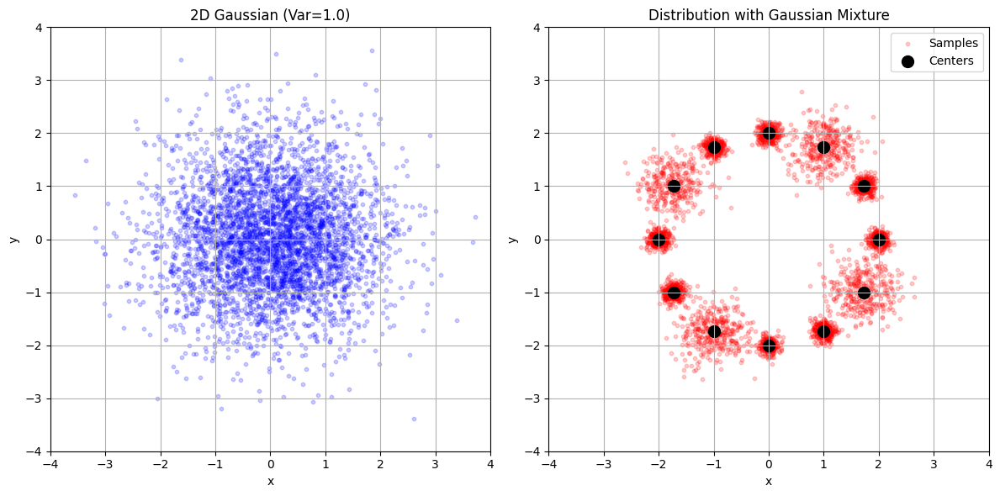

torch.Size([12, 2])


In [2]:
def generate_gaussian(n_dims, num_points, noise_std=1.0):
    """
    Generate an n-dimensional independent Gaussian distribution with specified variance.
    """
    return torch.randn(num_points, n_dims) * (noise_std)

def generate_circle_points(num_points=10, radius=1.0):
    # Create equally spaced angles
    angles = torch.linspace(0, 2*torch.pi, num_points+1)[:-1]  # Remove duplicate 0/2π point
    
    # Convert to Cartesian coordinates
    x = radius * torch.cos(angles)
    y = radius * torch.sin(angles)
    
    return torch.stack([x, y], dim=1)

def sample_from_gaussian_mixture(
    data: torch.Tensor,           # [N, D] - target points (means of Gaussians)
    sigma_f: torch.Tensor,        # [N] - variance for each Gaussian
    coefficients: torch.Tensor,   # [N] - mixture weights (should sum to 1)
    num_samples: int              # how many samples to draw
) -> torch.Tensor:
    """
    Samples from a mixture of Gaussians centered at `data`, with variance `sigma_f`
    and mixture weights `coefficients`.
    Returns:
        [num_samples, D] tensor of sampled points
    """
    N, D = data.shape

    # Choose components according to coefficients
    indices = torch.multinomial(coefficients, num_samples, replacement=True)  # [num_samples]

    # Gather the selected means and stds
    selected_means = data[indices]                # [num_samples, D]
    selected_sigmas = sigma_f[indices].unsqueeze(1)  # [num_samples, 1]

    # Sample from N(mean, sigma^2 * I)
    noise = torch.randn(num_samples, D, device=data.device)  # standard normal
    samples = selected_means + torch.sqrt(selected_sigmas) * noise
    return samples

# Generate samples with different variances
sigma_i = 1.0
sigma_f = torch.tensor([0.01, 0.01, 0.1, 0.01, 0.01, 0.1, 0.01, 0.01, 0.1, 0.01, 0.01, 0.1])
num_points = 4000
num_centers = 12
# Generate distributions
gaussian_samples1 = generate_gaussian(n_dims=2, num_points=num_points, noise_std=sigma_i)  # Default variance
circle_centers = generate_circle_points(num_points=num_centers, radius=2.0)

# Generate samples around the diagonal centers
coefficients = torch.tensor([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) 
circle_samples = sample_from_gaussian_mixture(
    data=circle_centers,
    sigma_f=sigma_f,  # Same variance for all centers
    coefficients=coefficients,
    num_samples=num_points
)
initial_dist = gaussian_samples1
final_dist = circle_centers

x_lim_params = (-4, 4)
y_lim_params = (-4, 4)

# Plot the distributions
plt.figure(figsize=(12, 6))

# Plot Gaussian distribution with variance=1.0
plt.subplot(1, 2, 1)
plt.scatter(initial_dist[:, 0].numpy(), initial_dist[:, 1].numpy(), 
            c='blue', alpha=0.2, s=10)
plt.title('2D Gaussian (Var=1.0)')
plt.xlabel('x')
plt.ylabel('y')
plt.xlim(x_lim_params)  
plt.ylim(y_lim_params)  
plt.grid(True)

# Plot Line distribution with Gaussian mixture samples
plt.subplot(1, 2, 2)
# Plot the sampled points (small red points)
plt.scatter(circle_samples[:, 0].numpy(), circle_samples[:, 1].numpy(), 
            c='red', alpha=0.2, s=10, label='Samples')
# Plot the centers (large black points)
plt.scatter(circle_centers[:, 0].numpy(), circle_centers[:, 1].numpy(), 
            c='black', s=100, label='Centers')
plt.title('Distribution with Gaussian Mixture')
plt.xlabel('x')
plt.ylabel('y')
plt.xlim(x_lim_params)  
plt.ylim(y_lim_params)  
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

print (final_dist.shape)

# Integration

In [3]:
# Run integration
start_time = time.time()
step_num = 100

# Run the integration
trajectory = forward_euler_integration_batch_time_var(
    initial_points=initial_dist,
    data=final_dist,
    t_start=0.0,
    t_end=1.0,
    num_steps=step_num,
    sigma_i=sigma_i,
    sigma_f=sigma_f,
    coefficients=coefficients
)

# Calculate elapsed time
elapsed_time = time.time() - start_time
print(f"Integration completed in {elapsed_time:.4f} seconds")


Integration completed in 0.5868 seconds


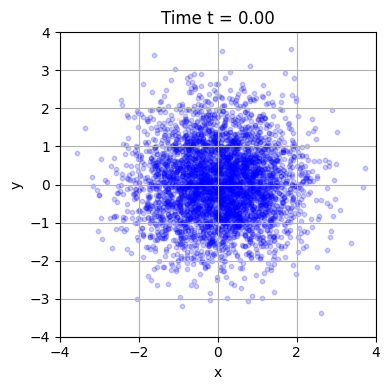

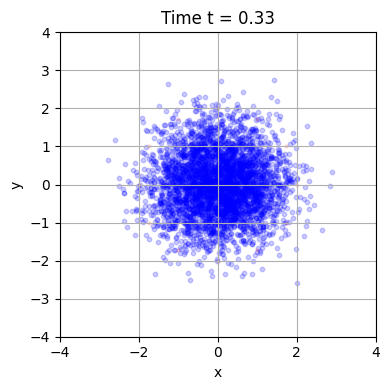

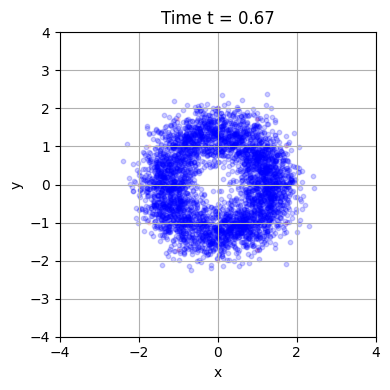

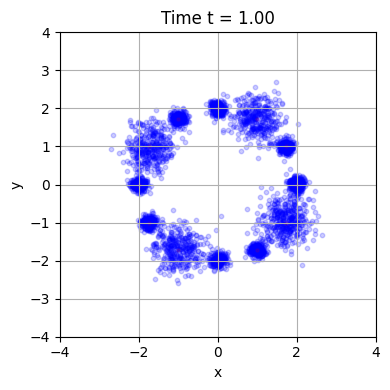

In [4]:
def get_even_steps(step_num: int, parts: int) -> list:
    return [round(i * step_num / parts) for i in range(parts + 1)]

# Example usage
parts = 3
steps_to_plot = get_even_steps(step_num, parts)

for i, step in enumerate(steps_to_plot):
    current_time = step/max(steps_to_plot)
    current_points = trajectory[step]
    
    plt.figure(figsize=(4, 4))
    plt.scatter(current_points[:, 0].numpy(), current_points[:, 1].numpy(),
               c='blue', alpha=0.2, s=10, label='Current Points')
    plt.scatter(final_dist[:, 0].numpy(), final_dist[:, 1].numpy(),
               c='red', alpha=0.1, s=5, label='Target Distribution')
    
    plt.title(f'Time t = {current_time:.2f}')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.xlim(x_lim_params)  
    plt.ylim(y_lim_params)  
    plt.grid(True)    
    plt.tight_layout()
    plt.show()

In [5]:
def animate_trajectory(trajectory, final_dist):
    fig, ax = plt.subplots(figsize=(6, 6))
    
    # Initialize scatter plots
    current_scatter = ax.scatter([], [], c='blue', alpha=0.2, s=10, label='Current Points')
    target_scatter = ax.scatter(final_dist[:, 0], final_dist[:, 1], c='red', alpha=1.0, s=15, label='Target Distribution')
    
    ax.set_xlim(x_lim_params)
    ax.set_ylim(y_lim_params)
    ax.grid(True)
    ax.legend(loc='upper right')
    
    def update(frame):
        current_scatter.set_offsets(trajectory[frame])
        ax.set_title(f'Time t = {frame/(len(trajectory)-1):.2f}')
        return current_scatter,
    
    ani = FuncAnimation(fig, update, frames=len(trajectory), interval=50, blit=True)
    plt.close()
    return ani

os.makedirs('imgs', exist_ok=True)

# Create animation and save
start_time = time.time()
ani = animate_trajectory(trajectory.numpy(), final_dist.numpy())
ani.save('imgs/flow_matching_analytic_line.gif', writer='pillow', fps=20, dpi=80)
# Calculate elapsed time
elapsed_time = time.time() - start_time
print(f"Gif made in {elapsed_time:.4f} seconds")

# To display in Jupyter notebook:
from IPython.display import HTML
HTML(ani.to_jshtml())

Gif made in 15.3002 seconds
